# Task 5
---

**Research Questions**
1. Are accidents more commonplace during periods of high wind or wet road conditions?
2. Does the time-of-day or the light conditions effect play a role in accident prevalence or severity?
3. What are the effects of speed limit on acident frequency or severity.


**Loading Data**

In [5]:
## Below done mostly by DIMA
import pandas_profiling as pdp
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Method to merge all .csv files into one, so we can enter all data
def merge_data():
  data = [files for files in os.listdir(os.path.join('..', '..', 'data','raw')) if files.endswith('.csv')]
  dataFrames = []

  for i in range(len(data)):
    dataFrames.append(pd.read_csv(r"{0}/{1}".format(os.path.join('..', '..', 'data','raw'), data[i]), low_memory=False))

  result = pd.concat(dataFrames, ignore_index=True)
  return load_and_process(result)

# Method Chaining
def load_and_process(result):
  # Method Chain 1 (Load data and deal with missing data)
  df1 = (
    result
      .dropna(subset=['Junction_Control'], how='all')
      .reset_index(drop=True)
  )
  # Method Chain 2 (Create new columns, drop others, and do processing)
  df2 = (
    df1.drop(['Accident_Index', 'Urban_or_Rural_Area', 'Location_Easting_OSGR', 'Location_Northing_OSGR', 
              'LSOA_of_Accident_Location', 
                 '2nd_Road_Class', '2nd_Road_Number', 'Junction_Detail', 
              'Local_Authority_(District)', 'Local_Authority_(Highway)'], axis=1)
        .reset_index(drop=True)
        .rename(columns={"Weather_Conditions": "Weather_Type", "Did_Police_Officer_Attend_Scene_of_Accident": "Police_Presense"})
        .replace({'Police_Presense': {'Yes': True, 'No': False}})
        .convert_dtypes()
        .sort_values("Year", ascending=True)
  )
  df2['Date'] = pd.to_datetime(df2['Date'], format='%d/%m/%Y')
  return df2

def year_analysis(df):
  df1 = (
        df.groupby(['Year', 'Number_of_Casualties']).size()
        .to_frame(name = 'Count').reset_index()
  )
  return df1

df = merge_data()



---
# Observations

In [4]:
df.describe()

,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,1st_Road_Class,1st_Road_Number,Speed_limit,Year
count,901280.000000,901280.000000,901315.000000,901315.000000,901315.000000,901315.000000,901315.000000,901315.000000,901315.000000,901315.000000,901315.000000
mean,-1.361466,52.546626,27.392350,2.863108,1.877528,1.331144,4.128367,4.136668,1060.280746,35.428075,2009.432804
std,1.342412,1.383365,24.806379,0.365861,0.602611,0.771135,1.900098,1.339502,1849.565321,11.308622,3.011951
min,-7.498973,49.914488,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,10.000000,2005.000000
25%,-2.245041,51.491166,5.000000,3.000000,2.000000,1.000000,3.000000,3.000000,0.000000,30.000000,2006.000000
50%,-1.341753,52.269987,21.000000,3.000000,2.000000,1.000000,4.000000,4.000000,180.000000,30.000000,2010.000000
75%,-0.191097,53.459997,44.000000,3.000000,2.000000,1.000000,6.000000,6.000000,826.500000,30.000000,2012.000000
max,1.759398,60.662043,98.000000,3.000000,28.000000,87.000000,7.000000,6.000000,9999.000000,70.000000,2014.000000


- Interesting data to notice is police force presence, minimum is 1 unit, and maximum is 98, seems a lit bit odd, since mean is roughly 27. Does it mean that this number is outlier or there was a major accident involved? However, by checking the max number of vehicles involed in incident, it's possible to have 98 police force there.
- Average speed limit in the UK is about 35 mph
- The average accident contains just under 2 cars, mean = 1.88 vehicles


In [6]:
df.profile_report() ## generate a profile report first to examine data. This may take several minutes

Summarize dataset:   0%|          | 0/37 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- 77.4 % of accidents had only one casualty. 15.9% had two casualties. 4.3% had three casualties. 4 -> 1.5%, 5-> 0.5% 
- 22.5 % of accidents invloved a single car, 69.1% invloved 2 cars, and 7% of accidents involved 3 cars
- 0.1 % of accidents record "Involvment with previous accident" (570 total reports) 
- 

[Text(0, 0.5, 'Number of Acidents (2005-2014)'),
 Text(0.5, 1.0, 'Accidents by Day of Week and Severity (1 is highest)')]

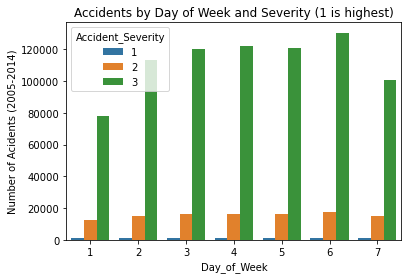

In [7]:
x = sns.countplot(x='Day_of_Week', data=df, hue='Accident_Severity')
x.set(ylabel='Number of Acidents (2005-2014)',title='Accidents by Day of Week and Severity (1 is highest)',)


Here we have the number of accidents of each severity class for each day of the week. Monday=1 and Sunday=7. Monday seems to be the safest day of the week while Saturday is the most dangerous.

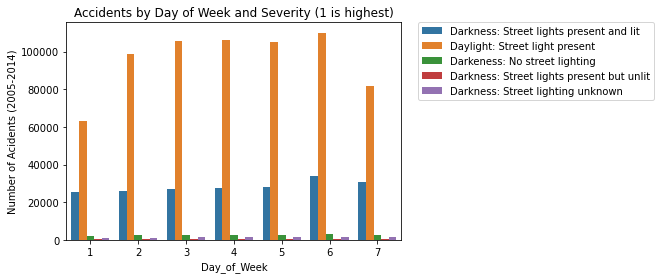

In [14]:
night = sns.countplot(x='Day_of_Week', data=df, hue='Light_Conditions')
night.set(ylabel='Number of Acidents (2005-2014)',title='Accidents by Day of Week and Severity (1 is highest)',)
# Put the legend out of the figure
night.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Proportionally more accidents (slightly) during the nighttime on Saturday (6) compared to other days

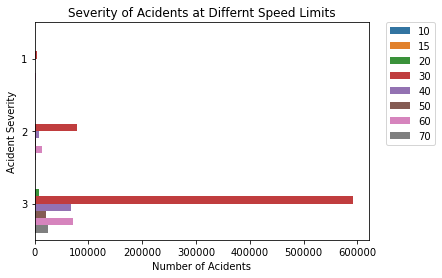

In [15]:
acident=sns.countplot(y='Accident_Severity', hue='Speed_limit',data=df)
acident.set(ylabel='Accident Severity',xlabel='Number of Accidents', title='Severity of Accidents at Differnt Speed Limits')
acident.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Most accidents at 30 mph

[Text(0, 0.5, 'Number of accidents'),
 Text(0.5, 0, 'Accident Severity'),
 Text(0.5, 1.0, 'Police Presence at Differnt Severity Accident Scenes')]

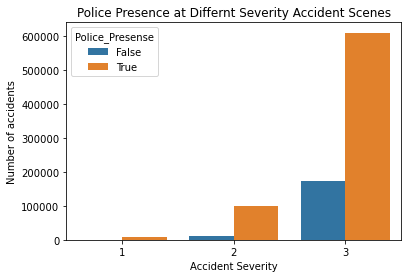

In [17]:
dfp = df.dropna() ## the Police_Presense has NA values

policepres=sns.countplot(x='Accident_Severity',hue='Police_Presense',data=dfp, )
policepres.set(ylabel='Number of accidents',xlabel='Accident Severity',title='Police Presence at Differnt Severity Accident Scenes')


Higher proportional police response to severity level 2 and level 3 accidents 

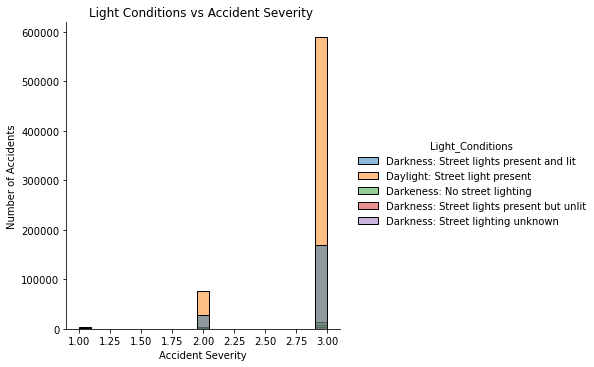

In [18]:
light = sns.displot(data=df,x='Accident_Severity',hue ='Light_Conditions' )
light.set(ylabel='Number of Accidents',xlabel='Accident Severity', title ='Light Conditions vs Accident Severity ')


Slightly higher porportion of night time crashes at level 2 severity accidents (?)

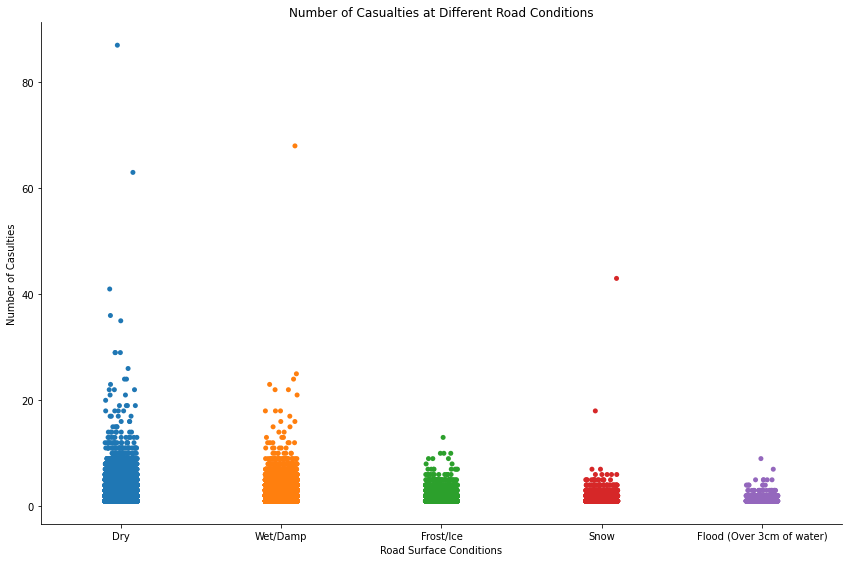

In [19]:
catplot = sns.catplot(data = df, y='Number_of_Casualties', x='Road_Surface_Conditions', height=7.5, aspect=11.7/7.5)

plt.ylabel("Number of Casulties")
plt.xlabel("Road Surface Conditions")
plt.title("Number of Casualties at Different Road Conditions")
catplot

Number of casuaties in traffic accidents in differnt weather conditions. It is interesting that not only do most accidents occur in dry conditions (representing the most common type of condition) but also that the most severe accidents occur in dry conditions rather than say, snowy conditions. Maybe people pay more attention when in adverse weather.

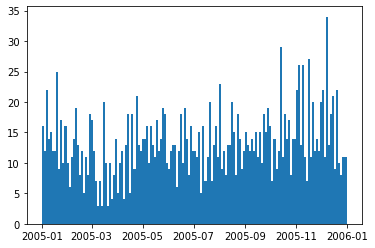

In [23]:
plt.hist(df[0:2000]["Date"], bins = 150)
plt.show()